In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [41]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [42]:
import DiadFit as pf
pf.__version__

'0.0.29'

In [43]:
DayFolder=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\Diad_Fitting_Nov22nd2022'
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [44]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [45]:
Diad_Files_Weak = joblib.load('Diad_Files_Grp2.sav')

In [46]:
Diad_Files_Weak

['POC39.txt',
 'POC30.txt',
 'POC38.txt',
 'POC20.txt',
 'POC29.txt',
 'POC37.txt',
 'POC19.txt',
 'POC25.txt',
 'POC26.txt',
 'POC24.txt',
 'POC23.txt',
 'POC28.txt',
 'POC18.txt',
 'POC22.txt',
 'POC27.txt',
 'POC21.txt',
 'POC36.txt',
 'POC17.txt',
 'POC35.txt',
 'POC11.txt',
 'POC16.txt',
 'POC15.txt',
 'POC34.txt',
 'POC10.txt',
 'POC9.txt',
 'POC14.txt',
 'POC13.txt',
 'POC33.txt',
 'POC12.txt',
 'POC32.txt',
 'POC31.txt']

In [59]:
# Select one file to tweak fit on
filename_Weak=Diad_Files_Weak[2]
filename_Weak

'POC38.txt'

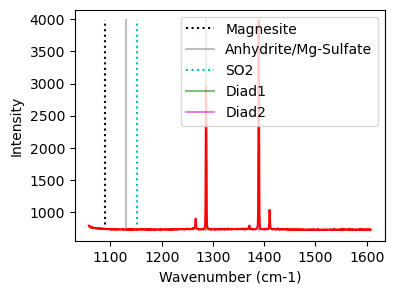

In [60]:
plot1=pf.plot_diad(path=spectra_path, filename=filename_Weak, filetype=filetype)

## Decide if you want a secondary peak
- If you dont have the peak, it is only a little slower, but it works if it only appears in a small number of spectra still

In [61]:
# Decide if you want to fit a carbonate peak or not here. 
fit_sec_peak=False

if fit_sec_peak is True:

    # Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
    generic_Config=pf.generic_peak_config(lower_bck=(1110, 1130), 
    upper_bck=(1160, 1180), cent_generic=1150, name='SO2')

    generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename_Weak, filetype=filetype)
    generic_fit

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [62]:
diad_id_config=pf.diad_id_config(height=50)
diad_id_config

diad_id_config(exclude_range1=None, exclude_range2=None, approx_diad2_pos=(1379, 1395), approx_diad1_pos=(1275, 1295), height=50, distance=5, threshold=0.5, width=0.5, prominence=10, plot_figure=True)

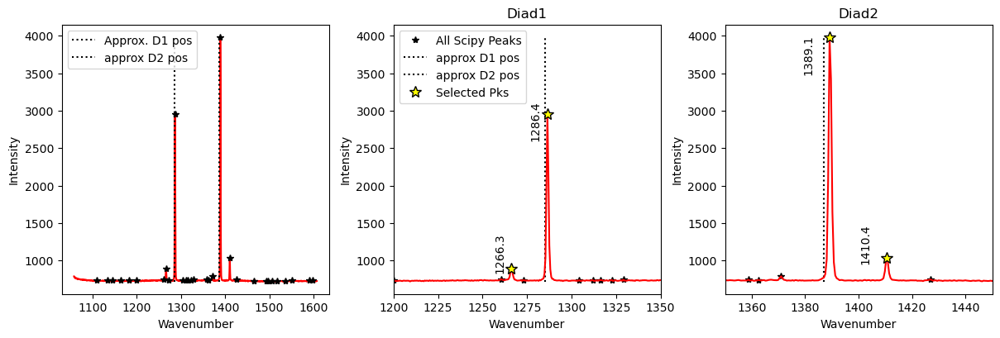

In [95]:
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=2
n_peaks_diad2=2
    
diad1_peaks, diad2_peaks=pf.identify_diad_peaks(
    config=diad_id_config, path=spectra_path, filename=filename_Weak,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, n_peaks_diad2=n_peaks_diad2)

In [113]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'

## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [114]:
diad1_fit_config_init=pf.diad1_fit_config(model_name=model_name,
N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220),
diad_sigma=0.5, sigma_allowance=2,
x_range_residual=10, x_range_baseline=30, HB_amplitude=5, diad_amplitude=1000)
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.5, sigma_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=1000, HB_amplitude=5, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Prop_Lor,HB1_Cent,HB1_Area,Residual_Diad1,Diad1_refit
0,1286.490981,1286.491031,3463.680869,0.652212,None,2228.73807,0.330733,1266.233108,360.906258,4.757665,False


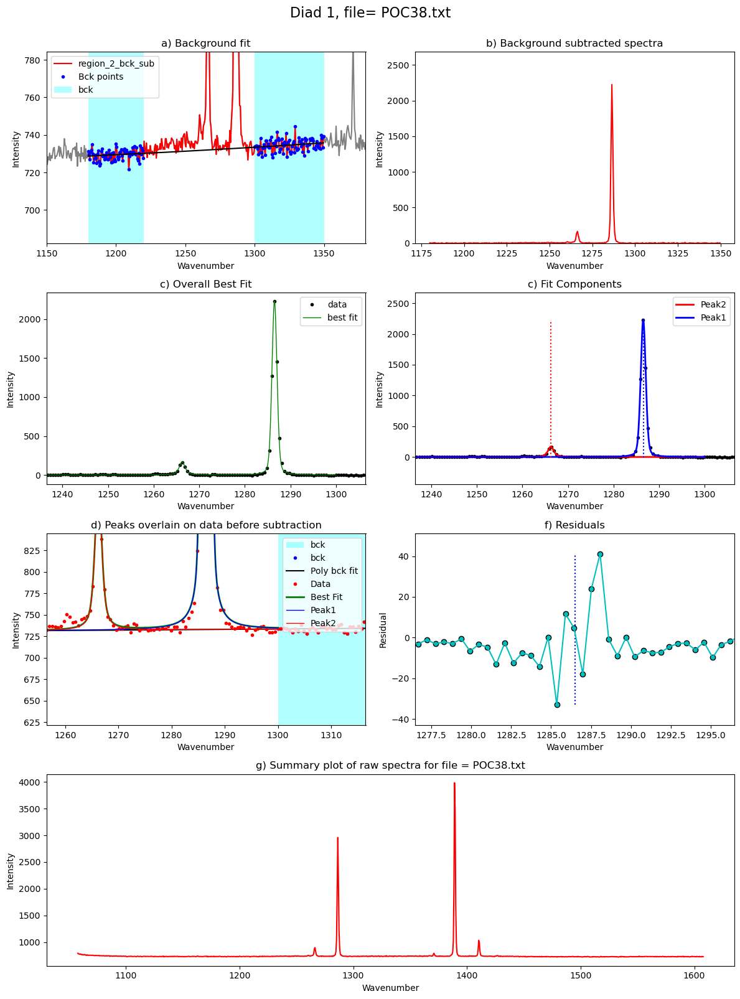

In [115]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad1_fit

In [116]:
### Now lets update the tweakable parameters with the sigma values
diad1_fit_config=diad1_fit_config_init
diad1_fit_config.diad_sigma=Diad1_fit['Diad1_Voigt_Sigma'][0]
diad1_fit_config.diad_amplitude=Diad1_fit['Diad1_Voigt_Area'][0]
diad1_fit_config.HB_amplitude=Diad1_fit['HB1_Area'][0]
diad1_fit_config.sigma_allowance=2
diad1_fit_config

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6522120142851426, sigma_allowance=2, N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1300, 1350), diad_amplitude=3463.6808689213035, HB_amplitude=360.9062575194706, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## Fit diad 2

In [117]:
diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
diad_sigma=0.2,  N_poly_bck_diad2=2,
HB_amplitude=100,                                          
x_range_residual=10, 
diad_amplitude=6000, 
x_range_baseline=30)
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.2, sigma_allowance=10, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=6000, HB_amplitude=100, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_refit
0,1389.302155,1389.302105,4978.698334,0.610619,None,1410.568659,502.252119,3450.503526,5.985211,0.307379,False


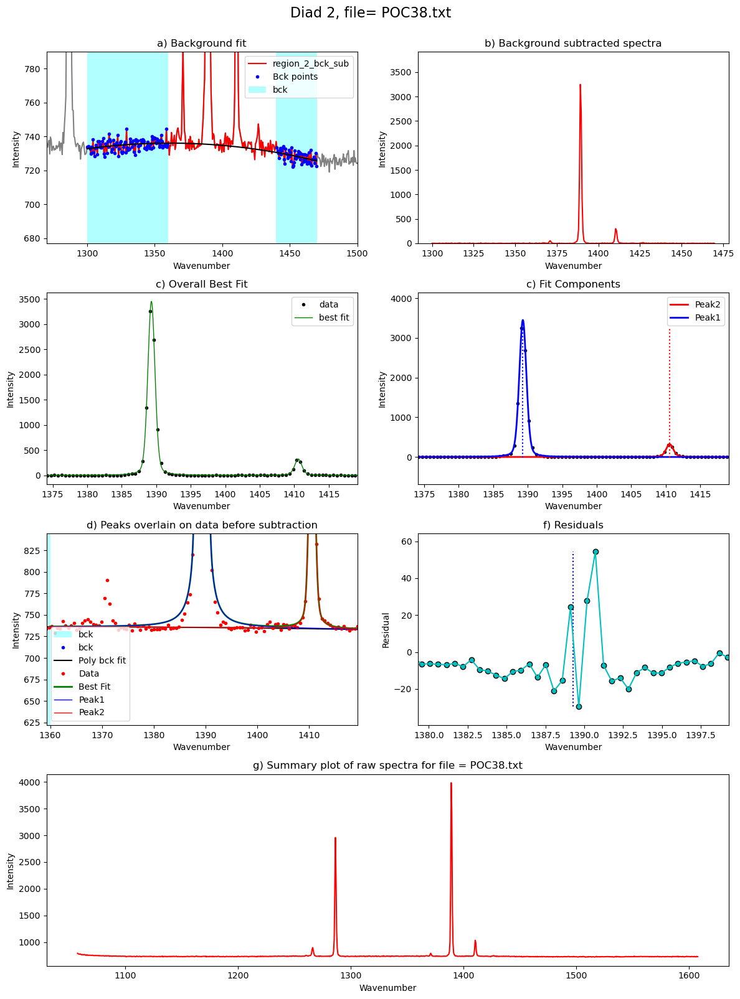

In [118]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config, peak_pos_voigt=diad2_peaks,
path=spectra_path, filename=filename_Weak, filetype=filetype, close_figure=False)
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

In [119]:
# Update param with new sigma
diad2_fit_config=diad2_fit_config_init
diad2_fit_config.diad_sigma=Diad2_fit['Diad2_Voigt_Sigma'][0]
diad2_fit_config.sigma_allowance=2
diad2_fit_config.diad_amplitude=Diad2_fit['Diad2_Voigt_Area'][0]
diad2_fit_config.HB_amplitude=Diad2_fit['HB2_Area'][0]
diad2_fit_config

diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6106187913594023, sigma_allowance=2, N_poly_bck_diad2=2, lower_bck_diad2=(1300, 1360), upper_bck_diad2=(1440, 1470), diad_amplitude=4978.698334316432, HB_amplitude=502.25211913097297, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

## You can also try looping if all your spectra are pretty similar

 32%|██████████████████████████▍                                                       | 10/31 [00:18<00:40,  1.93s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:1868: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:00<00:00,  1.95s/it]


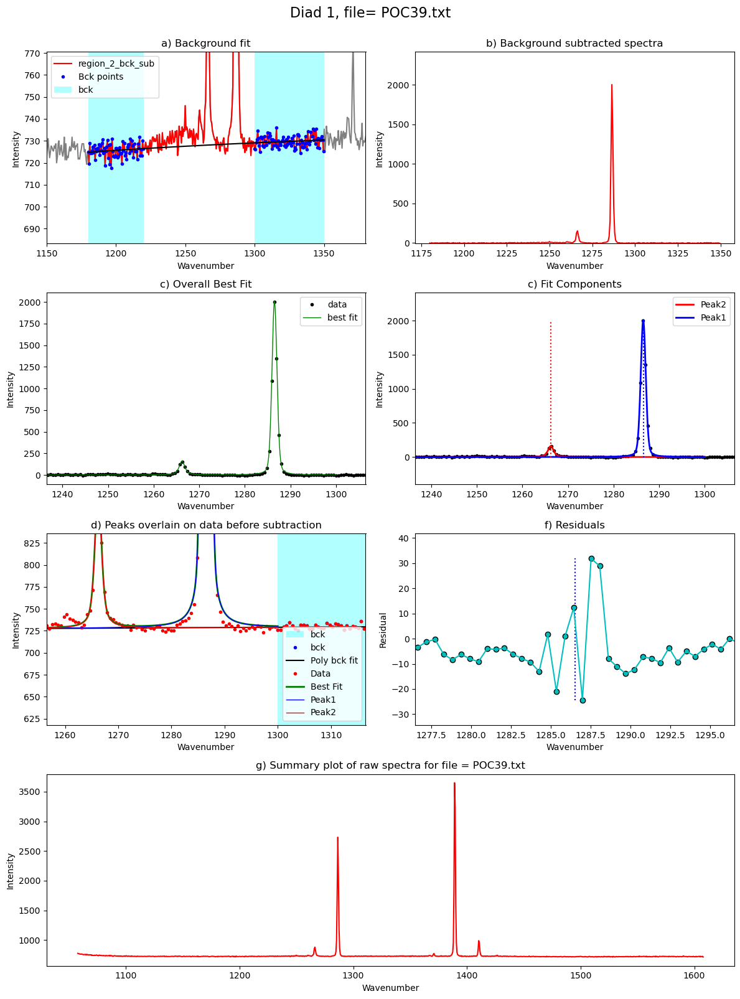

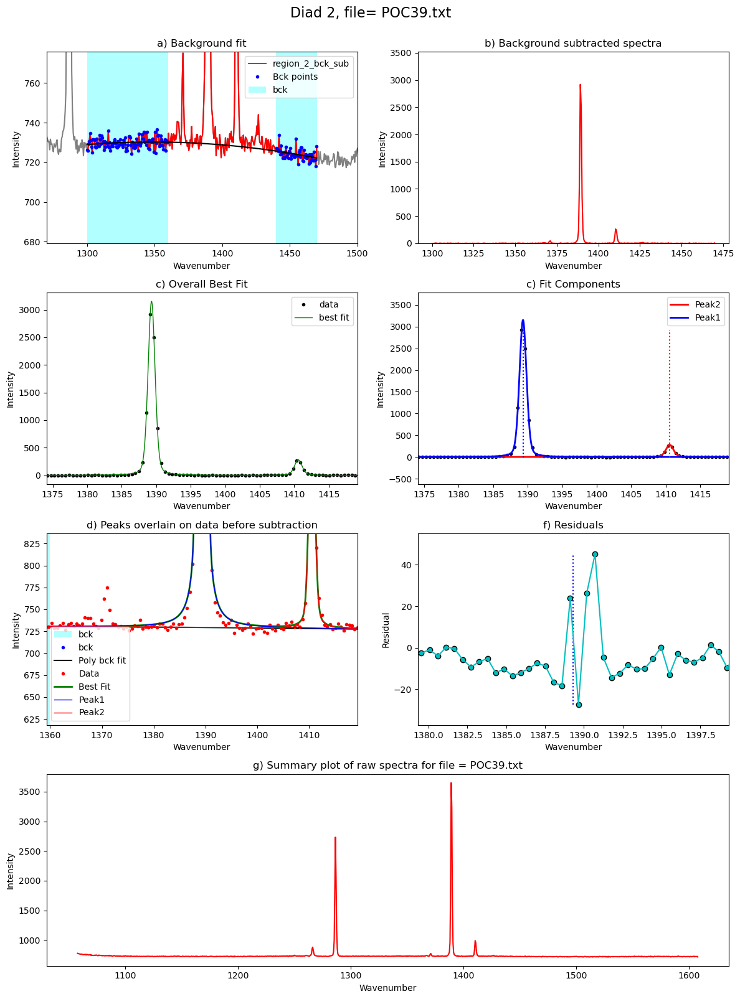

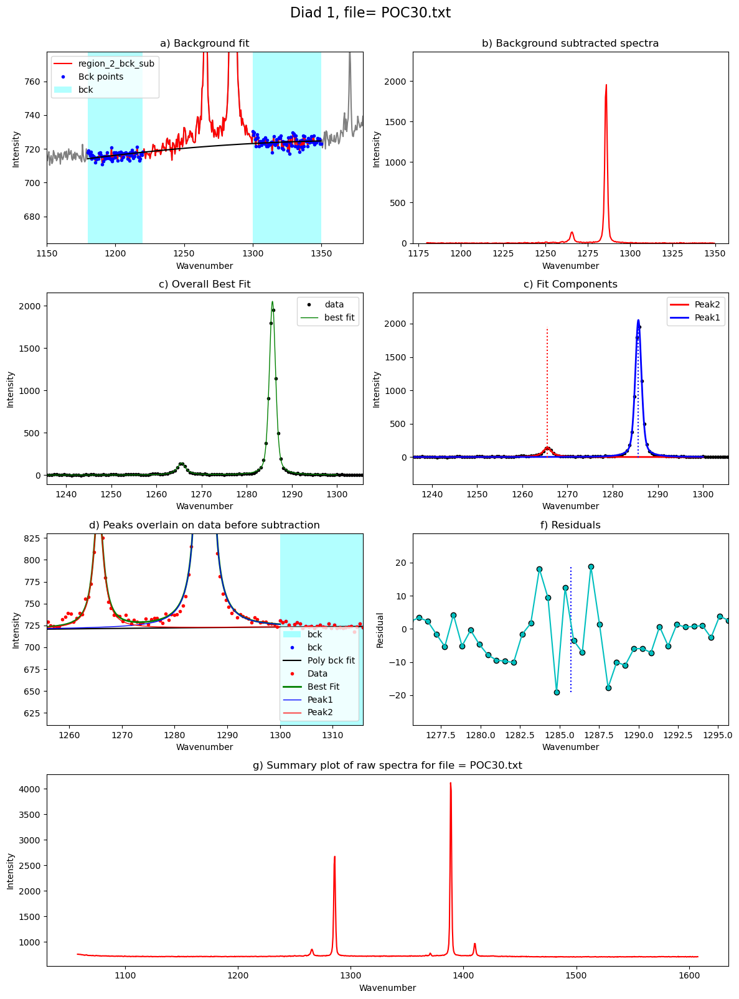

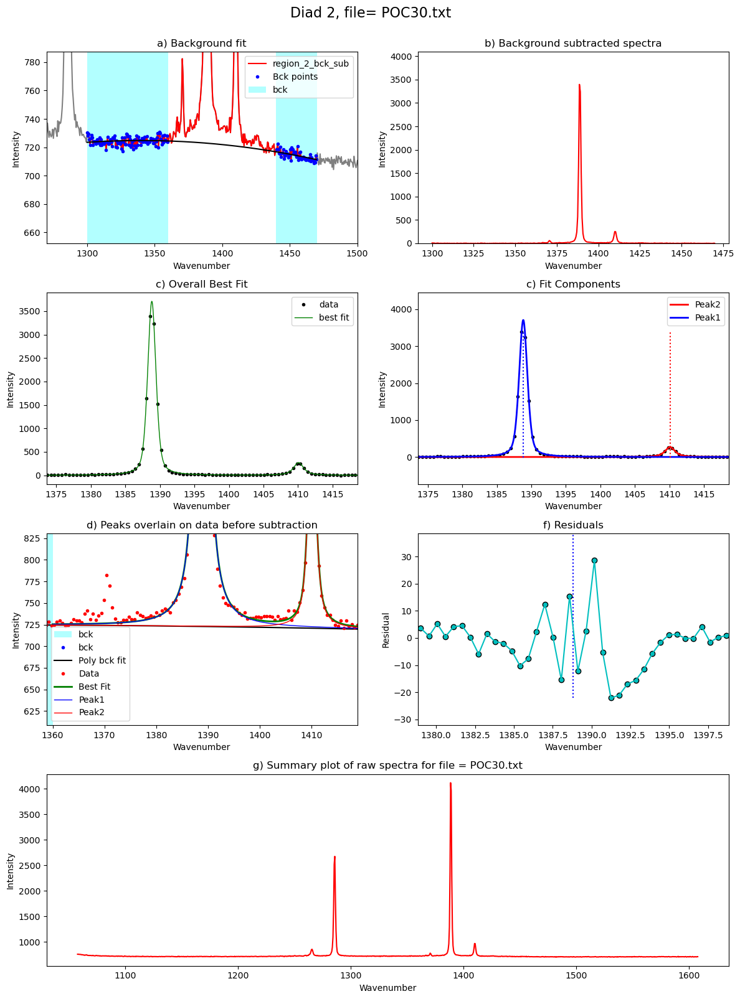

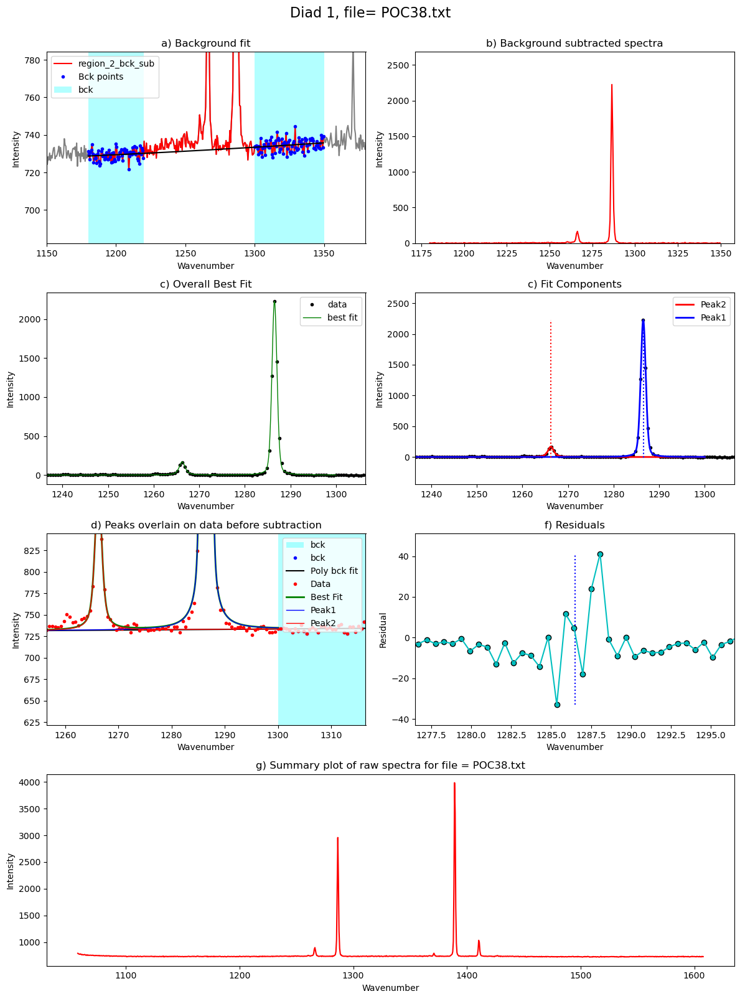

...

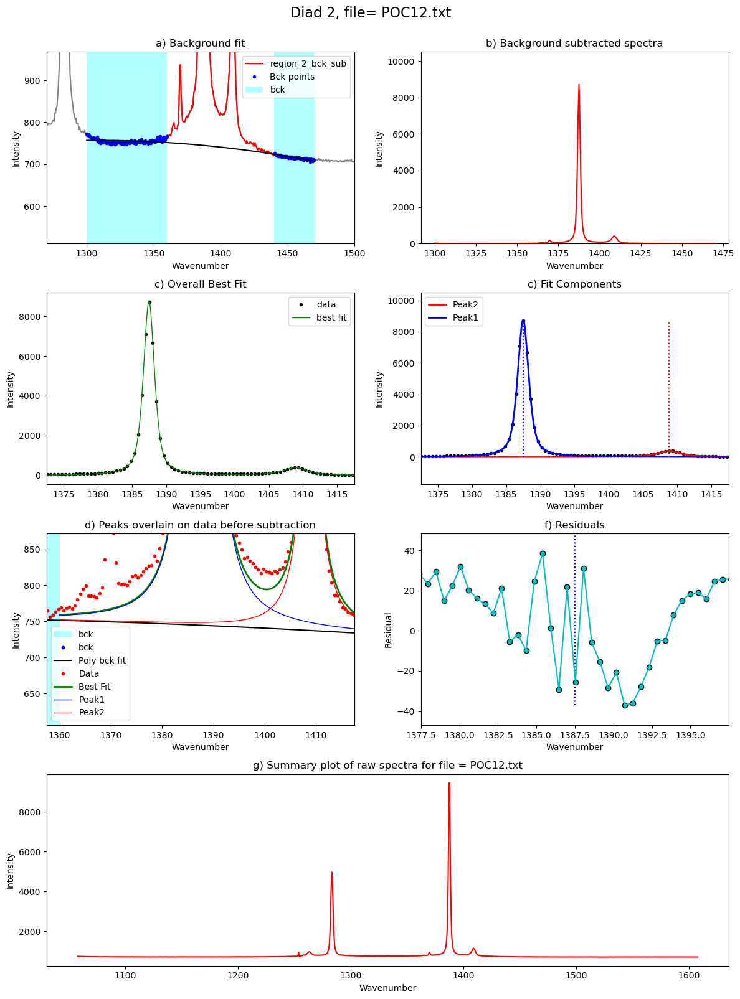

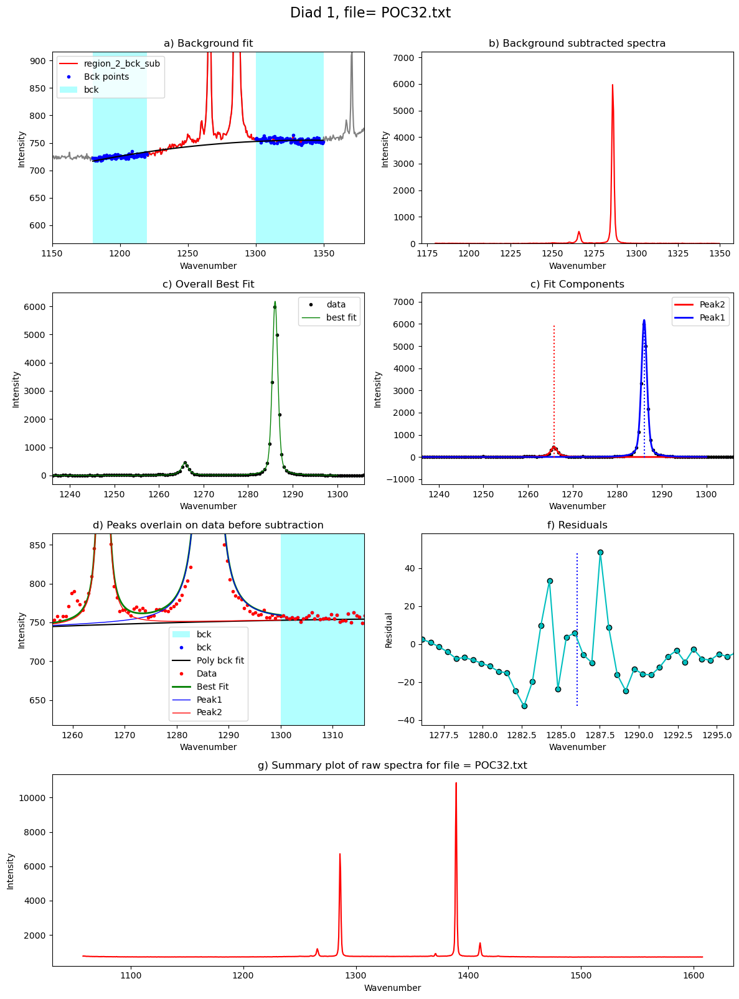

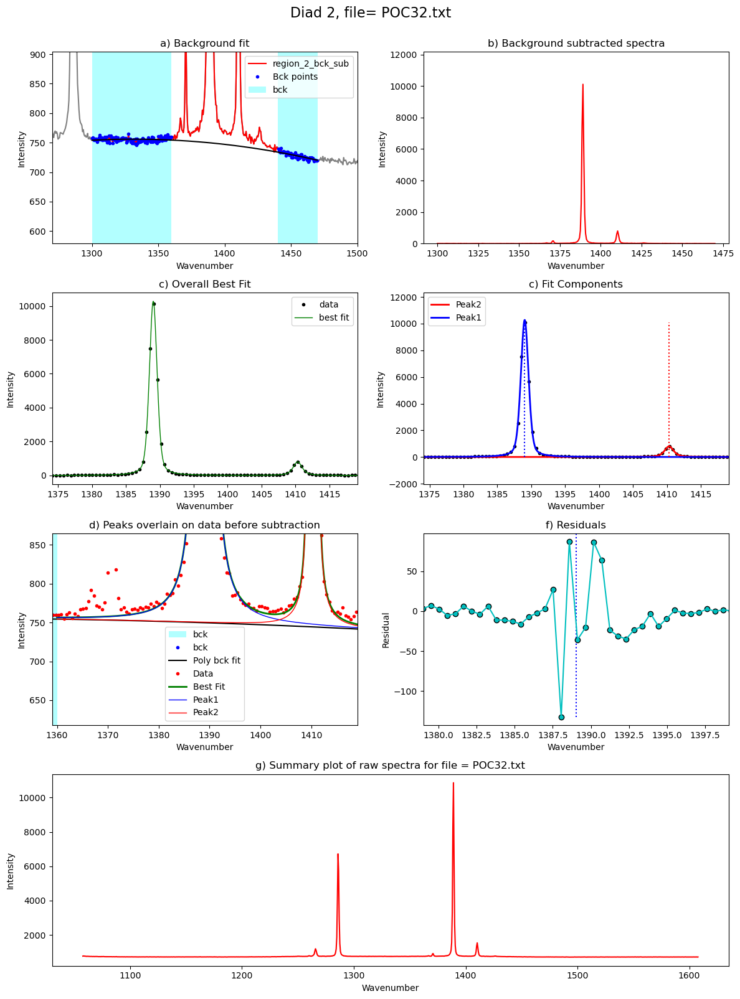

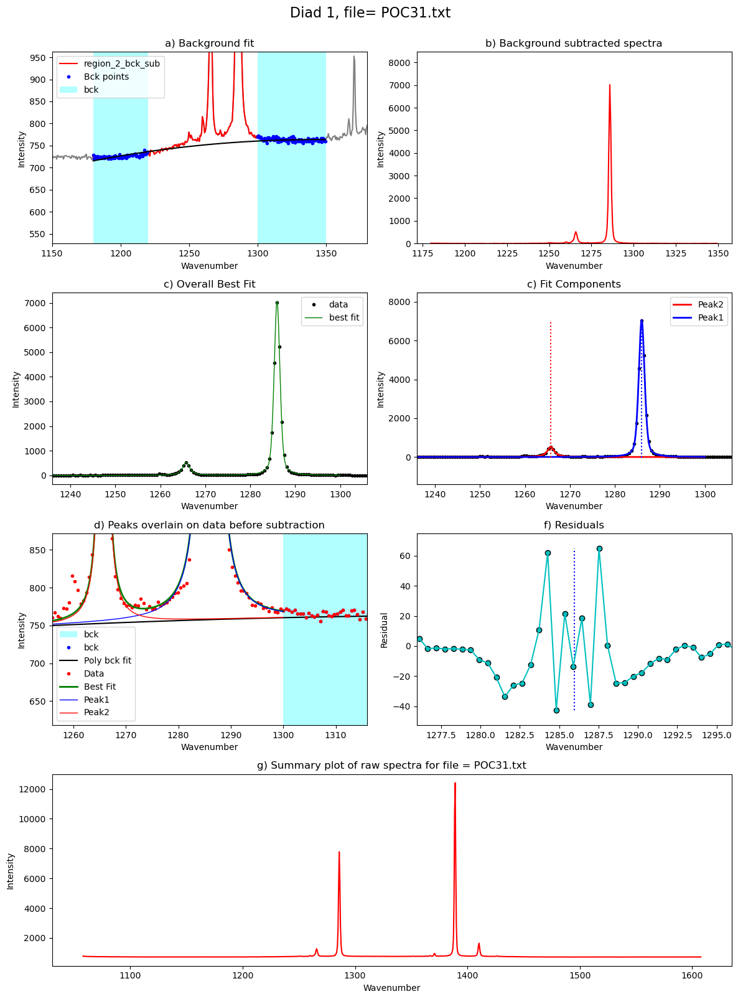

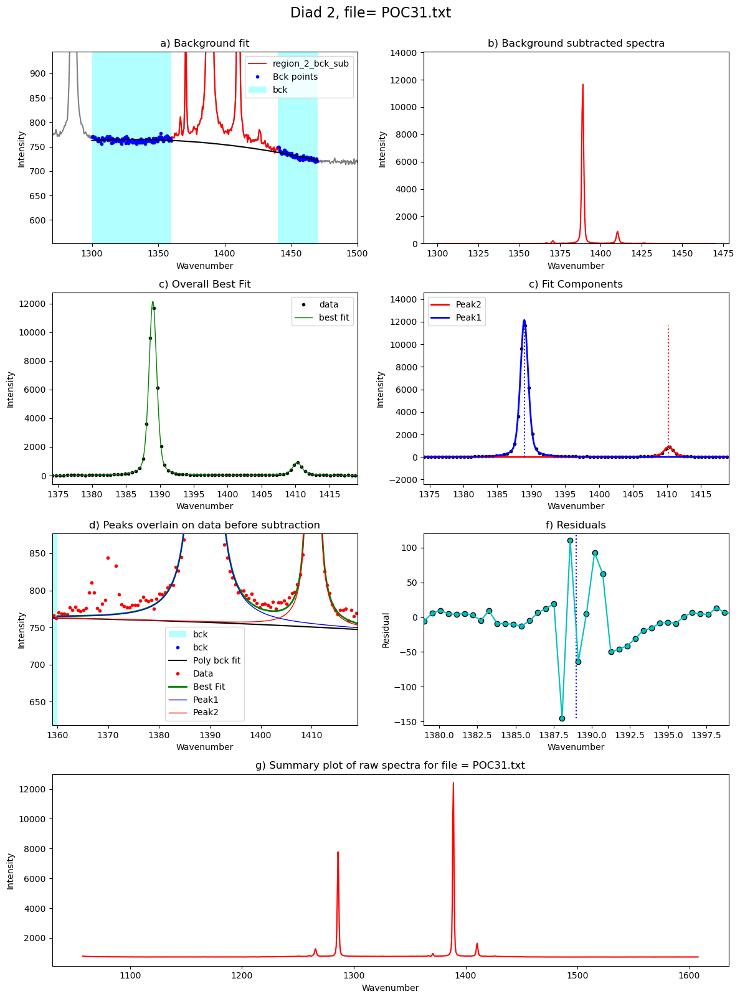

In [120]:
from tqdm import tqdm
plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_Weak_i=Diad_Files_Weak
df_Weak = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files_Weak))): #
    
    filename=Diad_Files_Weak[i]

    if fit_sec_peak is True:
    
        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
filename=filename, filetype=filetype)


    diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
            path=spectra_path, filename=filename,
filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
    n_peaks_diad2=n_peaks_diad2, plot_figure=False)

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config,
    config2=diad_id_config, peak_pos_voigt=diad1_peaks,
path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)
    
    
    if fit_sec_peak is True:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
    
    else:
        data=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    
 

    df_Weak = pd.concat([df_Weak, data], axis=0)


## Here are some figures to inspect the relationship between residuals and areas etc. 

In [121]:
# These ones triggered at least one warning, so need to be refit
refit_d1=(df_Weak['Diad1_refit']==True)
refit_d2=(df_Weak['Diad2_refit']==True)
refit=refit_d1|refit_d2

In [122]:
sum(refit_d2)

0

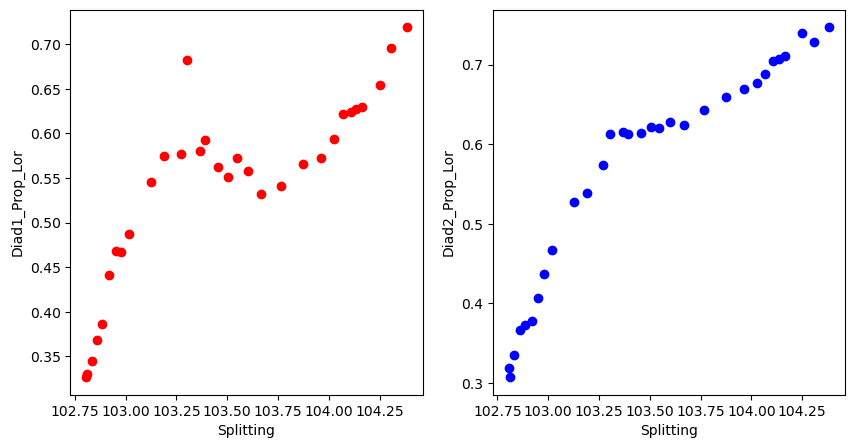

In [123]:

x='Splitting'
y1='Diad1_Prop_Lor'
y2='Diad2_Prop_Lor'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

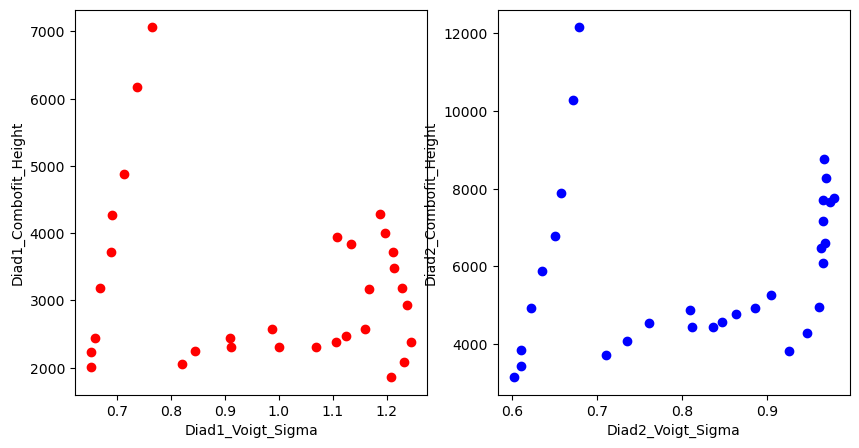

In [124]:
x1='Diad1_Voigt_Sigma'
x2='Diad2_Voigt_Sigma'
y1='Diad1_Combofit_Height'
y2='Diad2_Combofit_Height'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x1], df_Weak[y1], 'or')
ax2.plot(df_Weak[x2], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x1].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x2].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)

ax1.set_xlabel(x1)
ax1.set_ylabel(y1)
ax2.set_xlabel(x2)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

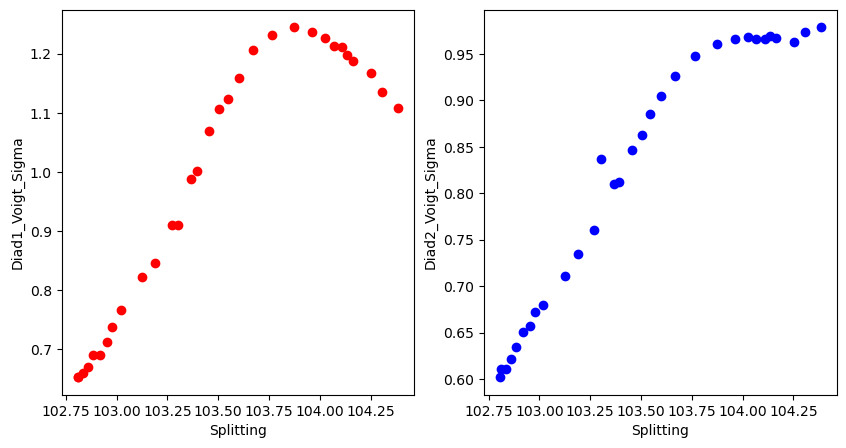

In [125]:
x='Splitting'
y1='Diad1_Voigt_Sigma'
y2='Diad2_Voigt_Sigma'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

In [126]:
df_anom=df_Weak.loc[refit]
df_anom['filename']

Series([], Name: filename, dtype: object)

In [127]:
if sum(refit_d2)>0:
    filename_refit=df_anom['filename'].iloc[0] + file_ext



    diad1_fit_config_refit=pf.diad1_fit_config(model_name=model_name,
    diad_sigma=0.3, sigma_allowance=1.1,
    x_range_residual=10, 
    x_range_baseline=30, HB_amplitude=5, diad_amplitude=100)


    diad2_fit_config_refit=pf.diad2_fit_config(model_name=model_name,
    diad_sigma=0.2, sigma_allowance=1.1,  
                                x_range_residual=10, 
                                diad_amplitude=400, 
                            x_range_baseline=30)
    diad2_fit_config


    Diad1_refit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad1_peaks,
    path=spectra_path, filename=filename_refit, filetype=filetype, close_figure=False)



    Diad2_refit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad2_peaks,                              
    path=spectra_path, filename=filename_refit, filetype=filetype, close_figure=False)



    data_refit=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)

    data_refit

In [128]:
if sum(refit_d2)>0:
    from tqdm import tqdm
    plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
    close_figure=False # Means shows figures in the notebook itself
    to_clipboard=False # Copies to clipboard

    df_Weak_refit = pd.DataFrame([])
    for i in tqdm(range(0, len(df_anom))):

        filename=df_anom['filename'].iloc[i] + file_ext

        generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename, filetype=filetype)


        diad1_peaks, diad2_peaks=pf.identify_diad_peaks(config=diad_id_config,
                path=spectra_path, filename=filename,
    filetype=filetype, n_peaks_diad1=n_peaks_diad1, 
        n_peaks_diad2=n_peaks_diad2, plot_figure=False)

        Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_refit,
        config2=diad_id_config, peak_pos_voigt=diad1_peaks,
    path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)

        Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_refit,
            config2=diad_id_config, peak_pos_voigt=diad2_peaks,
        path=spectra_path, filename=filename, filetype=filetype, close_figure=close_figure)



        data_refit=pf.combine_diad_outputs(filename=filename, prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit, Carb_fit=generic_fit)
    
 

        df_Weak_refit = pd.concat([df_Weak_refit, data_refit], axis=0)

## Insert this into the dataframe

In [129]:
## First remove the bad rows from the old dataframe
if sum(refit_d2)>0:
    Keep=df_Weak.loc[~refit]
    combo=pd.concat([df_Weak, df_Weak_refit], axis=0)
else:
    combo=df_Weak

In [131]:
combo.to_excel('Med_Diads.xlsx')

In [132]:
combo.to_clipboard(excel=True)